# **Curso Profesional de Machine Learning con Scikit-Learn**

Problemas principales que se resuelven usando Scikit-Learn:
1. Pre-procesamiento
2. Reducción de la dimensionalidad 
3. Clasificación
4. Regresión
5. Clustering
6. Selección de modelo

In [1]:
# Importamos las librerías que vamos a utilizar:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scipy as sp
import pyspark as ps
import seaborn as sns

import sklearn 

Para este curso, vamos a hacer uso de los siguientes datasets:

1. Heart Disease UCI: https://www.kaggle.com/ronitf/heart-disease-uci
2. Candy Power Ranking: https://www.kaggle.com/fivethirtyeight/the-ultimate-halloween-candy-power-ranking
3. Happiness by Country: https://www.kaggle.com/unsdsn/world-happiness

Sin embargo, no usaremos directamente los datasets, sino que usaremos unas versiones ligeramente modificadas, para que se adapten a los objetivos del curso


In [2]:
#Importamos el dataset de "heart":
heart = pd.read_csv('C:/Users/eespitia/Documents/VSCode Notebooks/Cursos de Platzi/Datasets/heart.csv')
heart.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,52,1,0,125,212,0,1,168,0,1.0,2,2,3,0
1,53,1,0,140,203,1,0,155,1,3.1,0,0,3,0
2,70,1,0,145,174,0,1,125,1,2.6,0,0,3,0
3,61,1,0,148,203,0,1,161,0,0.0,2,1,3,0
4,62,0,0,138,294,1,1,106,0,1.9,1,3,2,0


In [3]:
# Importamos el dataset de "candy":
candy = pd.read_csv('C:/Users/eespitia/Documents/VSCode Notebooks/Cursos de Platzi/Datasets/candy.csv')
candy.head()

,competitorname,chocolate,fruity,caramel,peanutyalmondy,nougat,crispedricewafer,hard,bar,pluribus,sugarpercent,pricepercent,winpercent
0,100 Grand,1,0,1,0,0,1,0,1,0,0.732,0.860,66.971725
1,3 Musketeers,1,0,0,0,1,0,0,1,0,0.604,0.511,67.602936
2,One dime,0,0,0,0,0,0,0,0,0,0.011,0.116,32.261086
3,One quarter,0,0,0,0,0,0,0,0,0,0.011,0.511,46.116505
4,Air Heads,0,1,0,0,0,0,0,0,0,0.906,0.511,52.341465


In [4]:
# Importamos el dataset de "happiness":
happiness = pd.read_csv('C:/Users/eespitia/Documents/VSCode Notebooks/Cursos de Platzi/Datasets/happiness.csv')
happiness.head()

,country,rank,score,high,low,gdp,family,lifexp,freedom,generosity,corruption,dystopia
0,Norway,1,7.537,7.594445,7.479556,1.616463,1.533524,0.796667,0.635423,0.362012,0.315964,2.277027
1,Denmark,2,7.522,7.581728,7.462272,1.482383,1.551122,0.792566,0.626007,0.355280,0.400770,2.313707
2,Iceland,3,7.504,7.622030,7.385970,1.480633,1.610574,0.833552,0.627163,0.475540,0.153527,2.322715
3,Switzerland,4,7.494,7.561772,7.426227,1.564980,1.516912,0.858131,0.620071,0.290549,0.367007,2.276716
4,Finland,5,7.469,7.527542,7.410458,1.443572,1.540247,0.809158,0.617951,0.245483,0.382612,2.430182







## Principal Component Analysis (PCA)

In [5]:
# Para este ejmplo, vamos a trabajar con el dataset de "heart":
heart.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,52,1,0,125,212,0,1,168,0,1.0,2,2,3,0
1,53,1,0,140,203,1,0,155,1,3.1,0,0,3,0
2,70,1,0,145,174,0,1,125,1,2.6,0,0,3,0
3,61,1,0,148,203,0,1,161,0,0.0,2,1,3,0
4,62,0,0,138,294,1,1,106,0,1.9,1,3,2,0


In [6]:
# Importamos las librerías que vamos a utilizar:

from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split

from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA

In [7]:
# Primero, separamos las variables independientes de la variable dependiente:

X_heart = heart.drop(['target'], axis=1)
y_heart = heart['target']

In [8]:
# Ahora, normalizamos las variables independientes (features) con la función "StandardScaler":
X_heart = StandardScaler().fit_transform(X_heart)

In [9]:
# Luego, dividimos el dataset en datos de entrenamiento y datos de prueba:

X_heart_train, X_heart_test, y_heart_train, y_heart_test = train_test_split(X_heart, y_heart, test_size=0.3, random_state=42)

### Declaramos y entrenamso el modelo:

In [10]:
# Hacemos el PCA
pca = PCA(n_components=2)
pca.fit(X_heart_train)

# Y el IPCA
ipca = IncrementalPCA(n_components=2, batch_size=10)
ipca.fit(X_heart_train)

# EL parámetro batch_size sirve para indicarle al algoritmo cuántos datos va a procesar en cada iteración.

IncrementalPCA(batch_size=10, n_components=2)

In [11]:
# Luego, vemos cuánta varianza explica cada componente:

print('Varianza explicada con PCA: ', pca.explained_variance_)
print('Varianza explicada con IPCA: ', ipca.explained_variance_)

print("\n")
# También, podemos ver cuánta varianza explica cada componente en porcentaje:

print('% Varianza explicada con PCA: ',(pca.explained_variance_ratio_*100).round(1))
print('% Varianza explicada con IPCA: ',(ipca.explained_variance_ratio_*100).round(1))

Varianza explicada con PCA:  [2.68677659 1.57829878]
Varianza explicada con IPCA:  [2.67387288 1.54683212]


% Varianza explicada con PCA:  [20.9 12.3]
% Varianza explicada con IPCA:  [20.8 12. ]


C:\Users\eespitia\AppData\Local\Temp\ipykernel_17320\3823276350.py:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


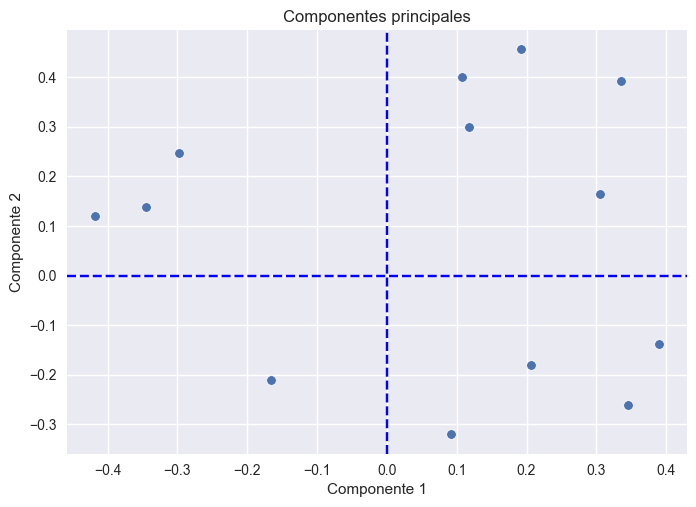

In [12]:
# Graficamos las componentes obtenidas con PCA:
plt.style.use("seaborn")

sns.scatterplot(x=pca.components_[0], y=pca.components_[1])

plt.xlabel('Componente 1')
plt.ylabel('Componente 2')
plt.title('Componentes principales')

plt.axhline(0, color='blue', linestyle='--')
plt.axvline(0, color='blue', linestyle='--')

plt.show()

C:\Users\eespitia\AppData\Local\Temp\ipykernel_17320\2972151825.py:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


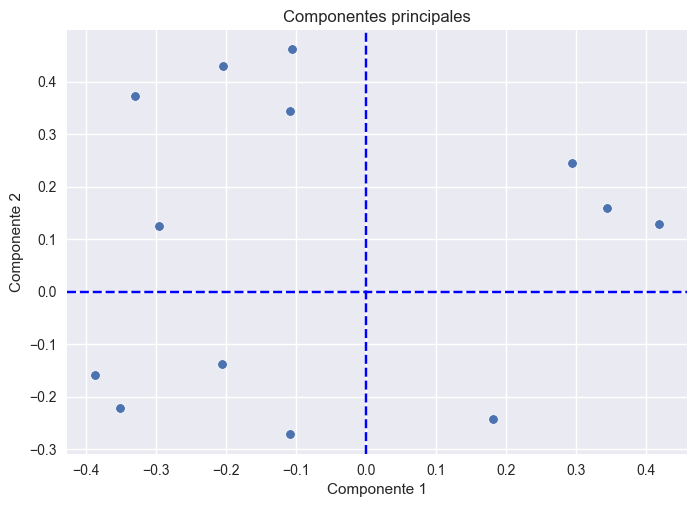

In [13]:
# Grafiacamos las componentes obtenidas con IPCA:
plt.style.use("seaborn")

sns.scatterplot(x=ipca.components_[0], y=ipca.components_[1])

plt.xlabel('Componente 1')
plt.ylabel('Componente 2')
plt.title('Componentes principales')

plt.axhline(0, color='blue', linestyle='--')
plt.axvline(0, color='blue', linestyle='--')

plt.show()

C:\Users\eespitia\AppData\Local\Temp\ipykernel_17320\961016063.py:2: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn")


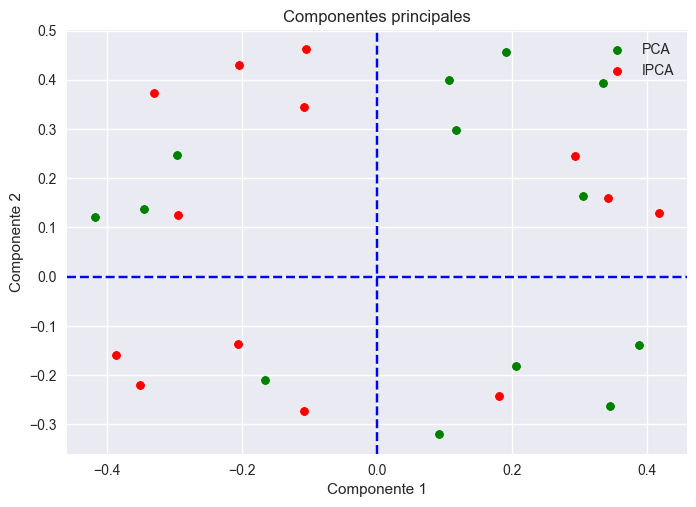

In [14]:
# Ahora, graficamos ambas componentes en el mismo gráfico, para ver la diferencia entre ellas:
plt.style.use("seaborn")

sns.scatterplot(x=pca.components_[0], y=pca.components_[1], color= "green")
sns.scatterplot(x=ipca.components_[0], y=ipca.components_[1], color = "red")

plt.xlabel('Componente 1')
plt.ylabel('Componente 2')
plt.title('Componentes principales')

plt.axhline(0, color='blue', linestyle='--')
plt.axvline(0, color='blue', linestyle='--')

plt.legend(labels=['PCA', 'IPCA'])

plt.show()

## Introducción a Kernels:

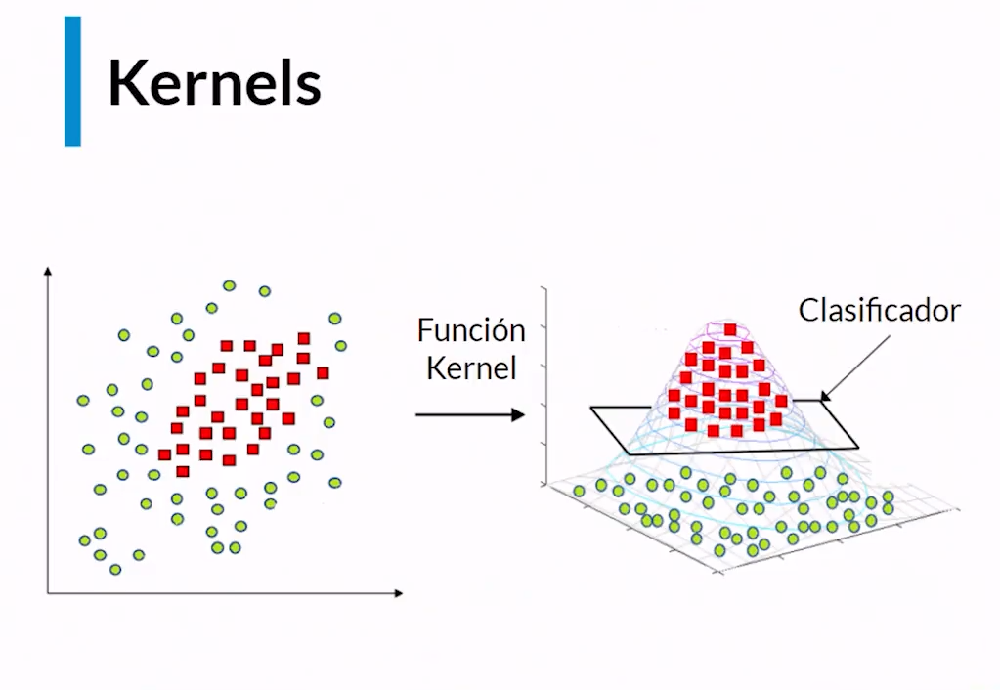

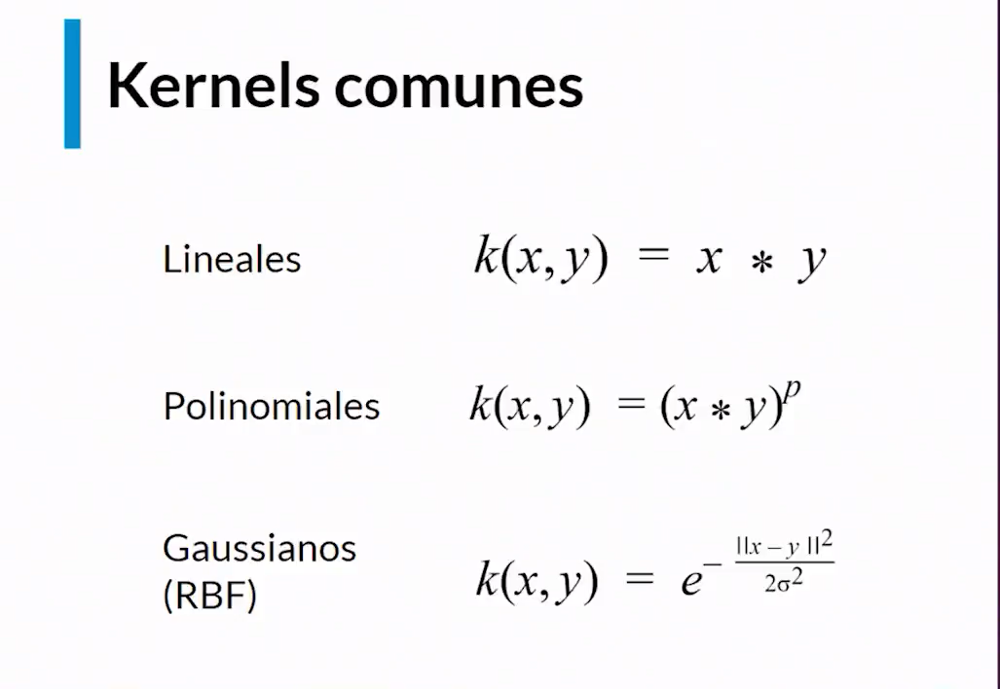

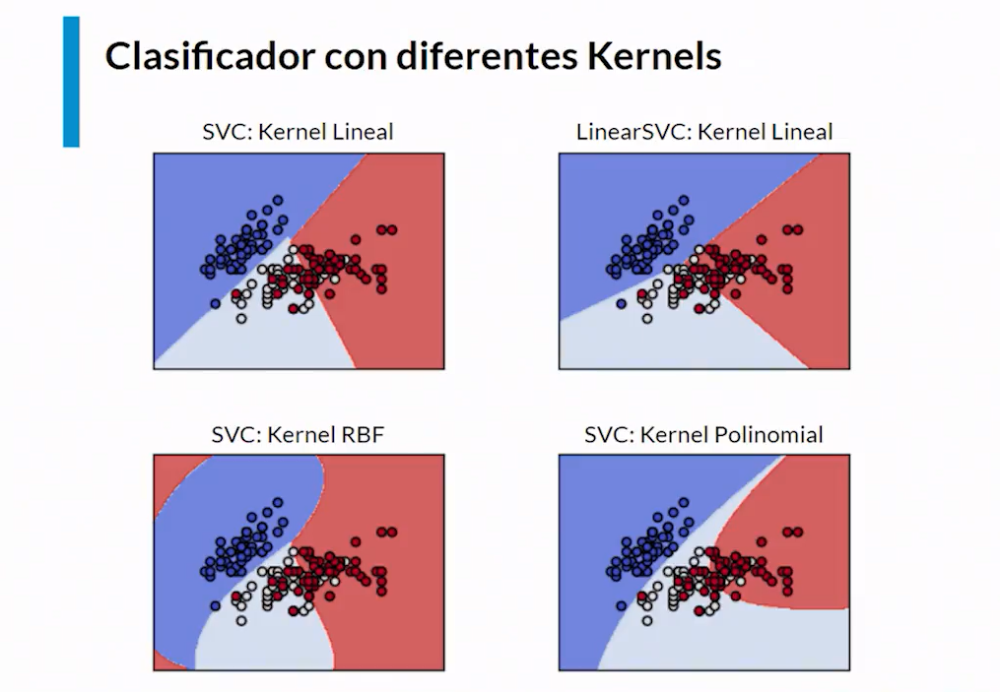

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scipy as sp
import pyspark 
import seaborn as sns

import sklearn 

In [16]:
from sklearn.decomposition import KernelPCA

## Introducción a Regularización:

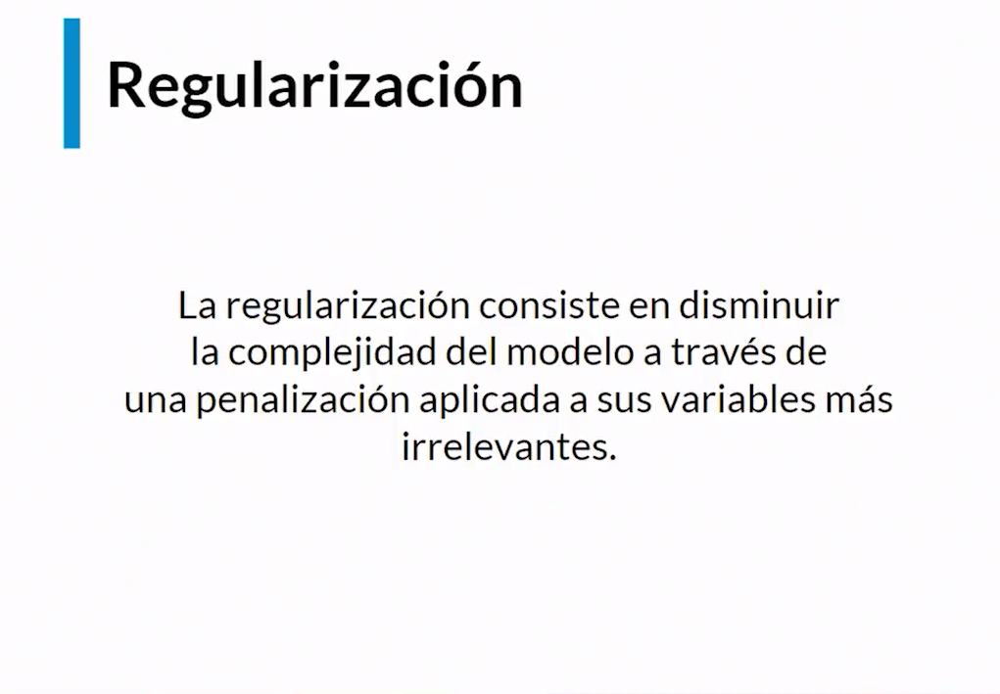

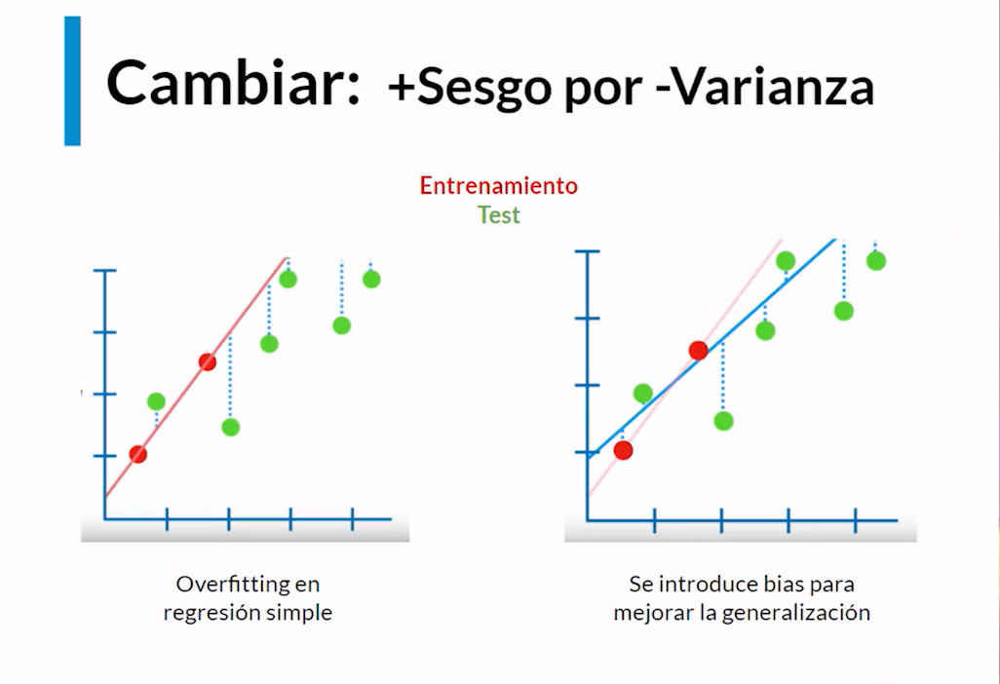

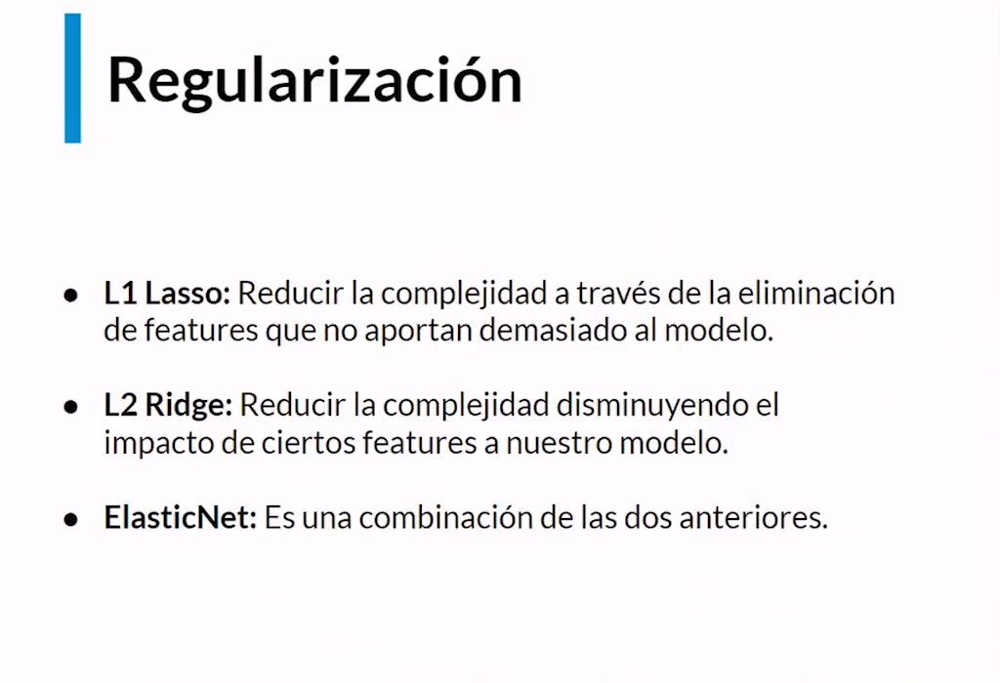

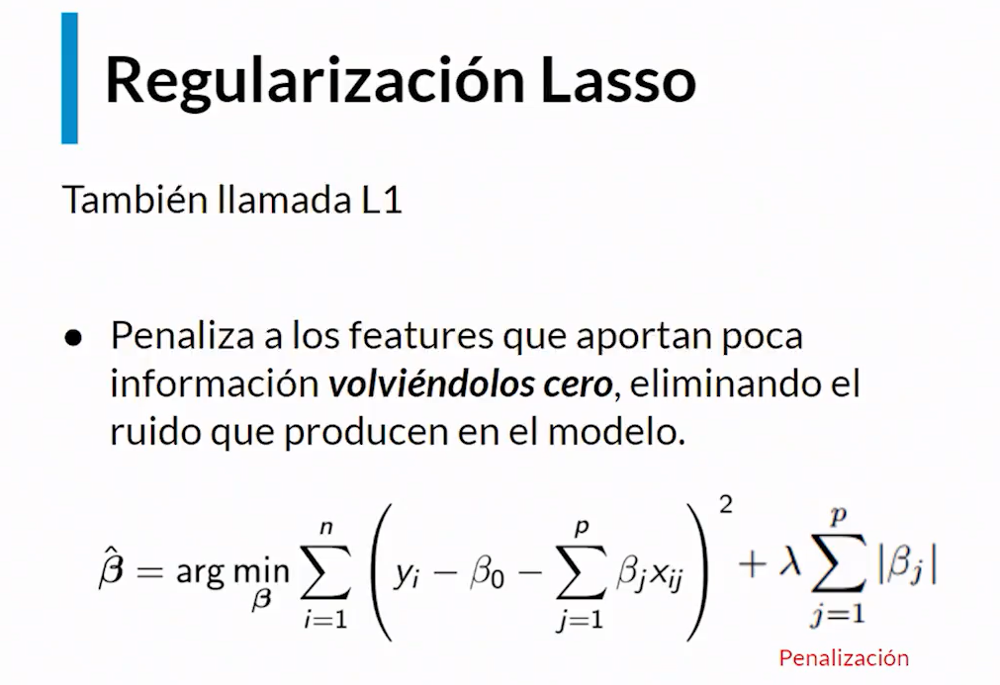

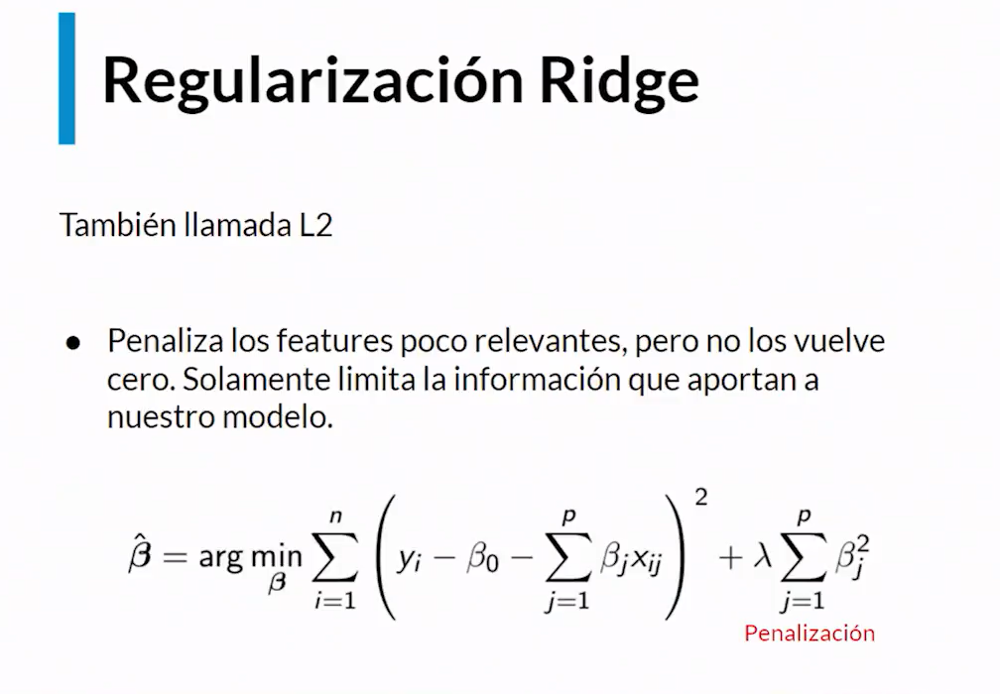

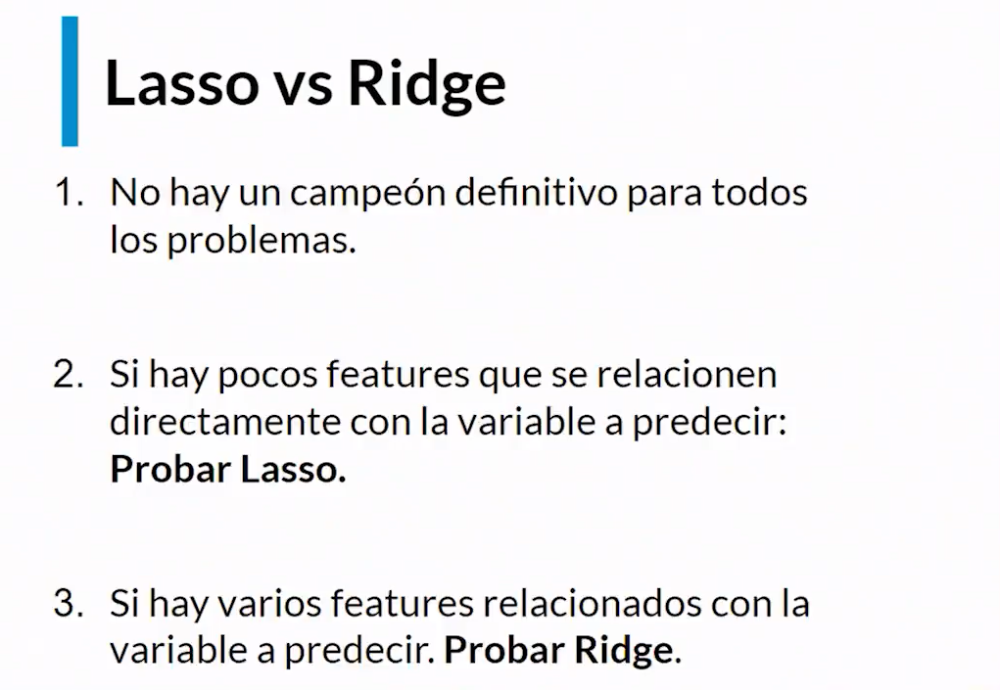

A continuación, realizamremos un ejemplo de las implementaciones de "Lasso" y "Ridge", con el conjunto de "happiness":

In [17]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scipy as sp
import pyspark
import seaborn as sns

import sklearn

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Datos:

happiness.head()

,country,rank,score,high,low,gdp,family,lifexp,freedom,generosity,corruption,dystopia
0,Norway,1,7.537,7.594445,7.479556,1.616463,1.533524,0.796667,0.635423,0.362012,0.315964,2.277027
1,Denmark,2,7.522,7.581728,7.462272,1.482383,1.551122,0.792566,0.626007,0.355280,0.400770,2.313707
2,Iceland,3,7.504,7.622030,7.385970,1.480633,1.610574,0.833552,0.627163,0.475540,0.153527,2.322715
3,Switzerland,4,7.494,7.561772,7.426227,1.564980,1.516912,0.858131,0.620071,0.290549,0.367007,2.276716
4,Finland,5,7.469,7.527542,7.410458,1.443572,1.540247,0.809158,0.617951,0.245483,0.382612,2.430182


In [18]:
# Primero, selecccionamos las variables predictivas de interés, así como la variable dependiente:
X = happiness[['gdp', 'family', 'lifexp', 'freedom', 'corruption', 'generosity', 'dystopia']]

y= happiness[["score"]]

In [19]:
# Luego, separamos los datos en datos de entrenamiento y datos de prueba:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [20]:
# Ahora, creamos el modelo de regresión lineal:
lr = LinearRegression()
lr.fit(X_train, y_train)

LinearRegression()

In [21]:
# ahora, calculamos las predicciones del modelo:
y_predict = lr.predict(X_test)

In [22]:
# Ahora, hacemos la regrassión con Lasso:
lasso = Lasso(alpha=0.02) # el parámetro alpha es el que controla la regularización
                          # en la imagen anterior, alpha es el parámetro lambda
lasso.fit(X_train, y_train)

Lasso(alpha=0.02)

In [23]:
# Ahora, calculamos las prediccioness del modelo lasso:
y_predict_lasso = lasso.predict(X_test)

In [24]:
# Ahora, hacemos la regrassión con Ridge:
ridge = Ridge(alpha=0.02) # el parámetro alpha es el que controla la regularización
                            # en la imagen anterior, alpha es el parámetro lambda
ridge.fit(X_train, y_train)

Ridge(alpha=0.02)

In [25]:
# Ahora, calculamos las predicciones del modelo ridge:
y_predict_ridge = ridge.predict(X_test)

In [26]:
linear_loss = mean_squared_error(y_test, y_predict)
lasso_loss = mean_squared_error(y_test, y_predict_lasso)
ridge_loss = mean_squared_error(y_test, y_predict_ridge)

print('Error de regresión lineal: ', linear_loss)
print("="*50)
print('Error de regresión Lasso: ', lasso_loss)
print("="*50)
print('Error de regresión Ridge: ', ridge_loss)

Error de regresión lineal:  9.880057514929899e-08
Error de regresión Lasso:  0.039523480898106714
Error de regresión Ridge:  3.2864544256879487e-06


In [27]:
loss = pd.DataFrame({'linear': linear_loss, 'lasso': lasso_loss, 'ridge': ridge_loss}, index=['MSE']) 
loss = loss.transpose()
loss.sort_values(by='MSE', ascending=True)

,MSE
linear,9.880058e-08
ridge,3.286454e-06
lasso,3.952348e-02


## Introducción a los valores atípicos:

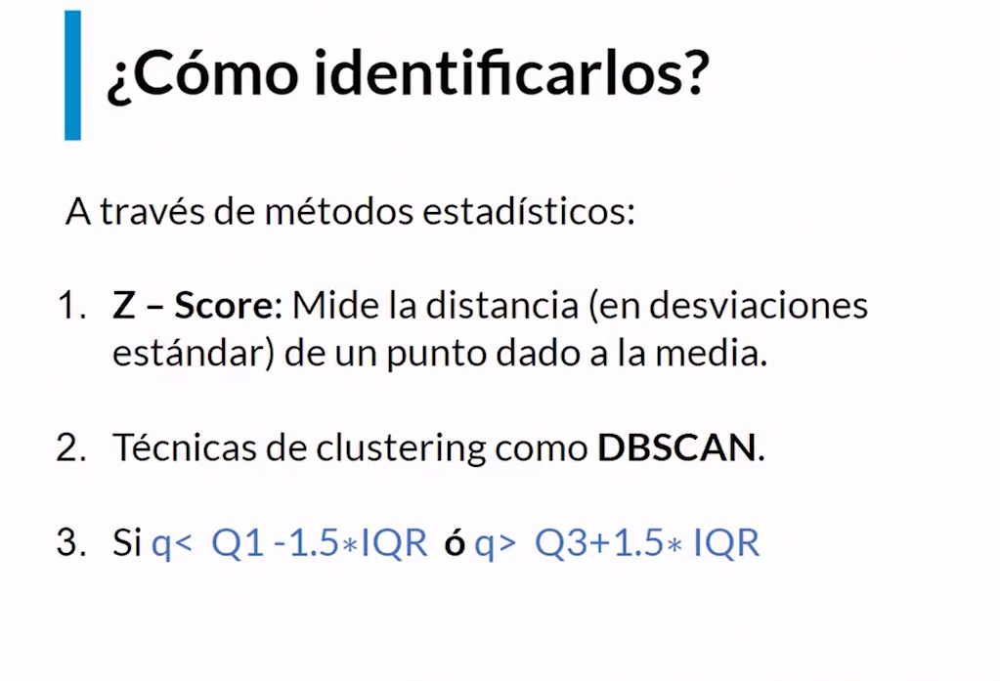

## Regrsiones robustas:

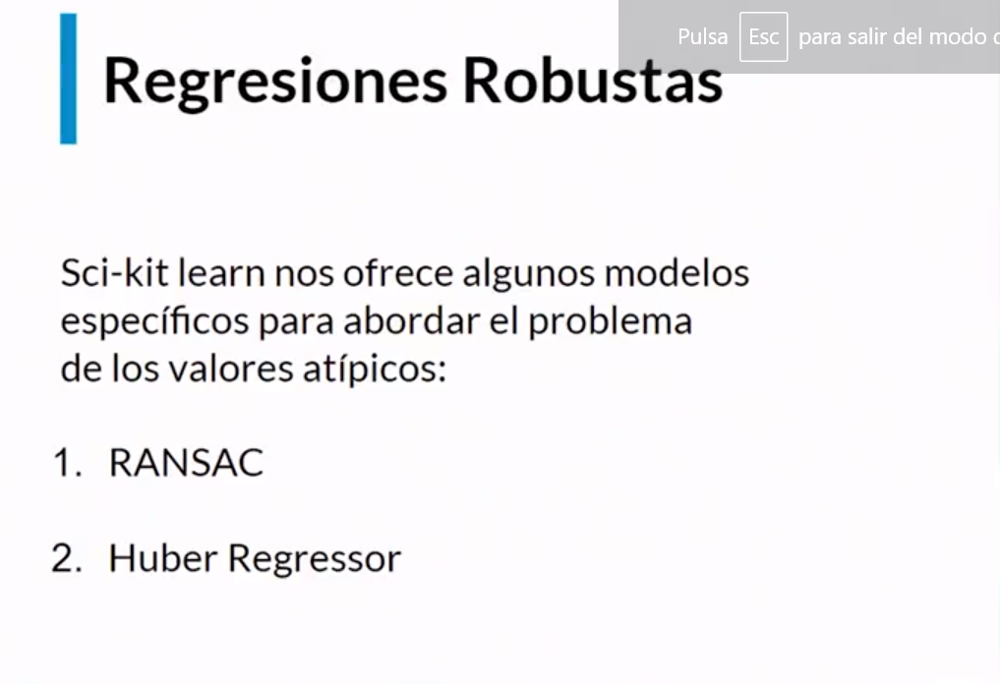

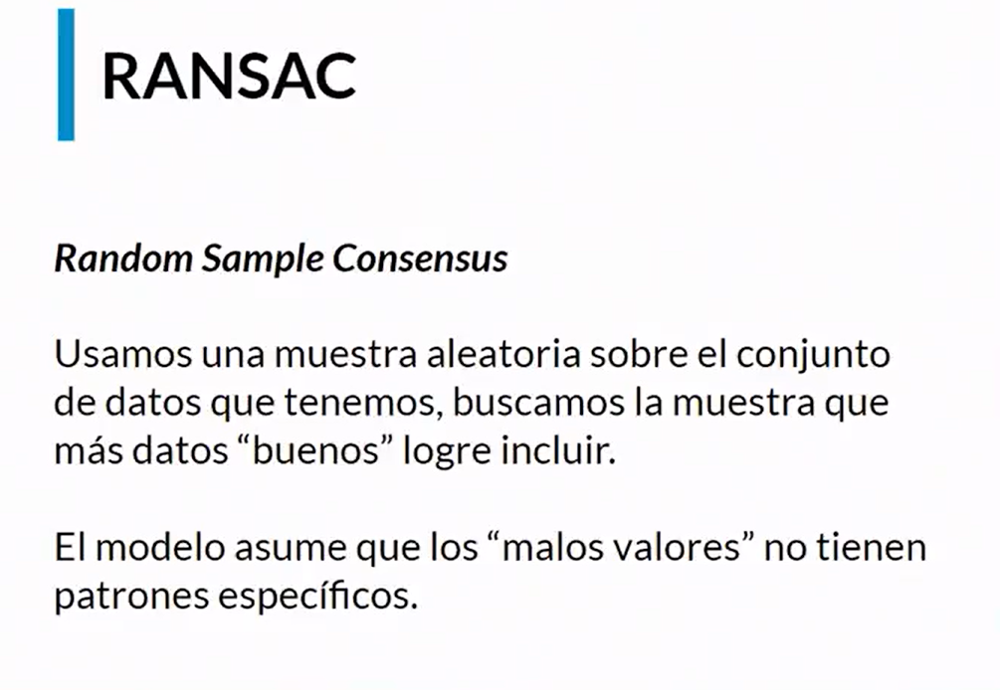

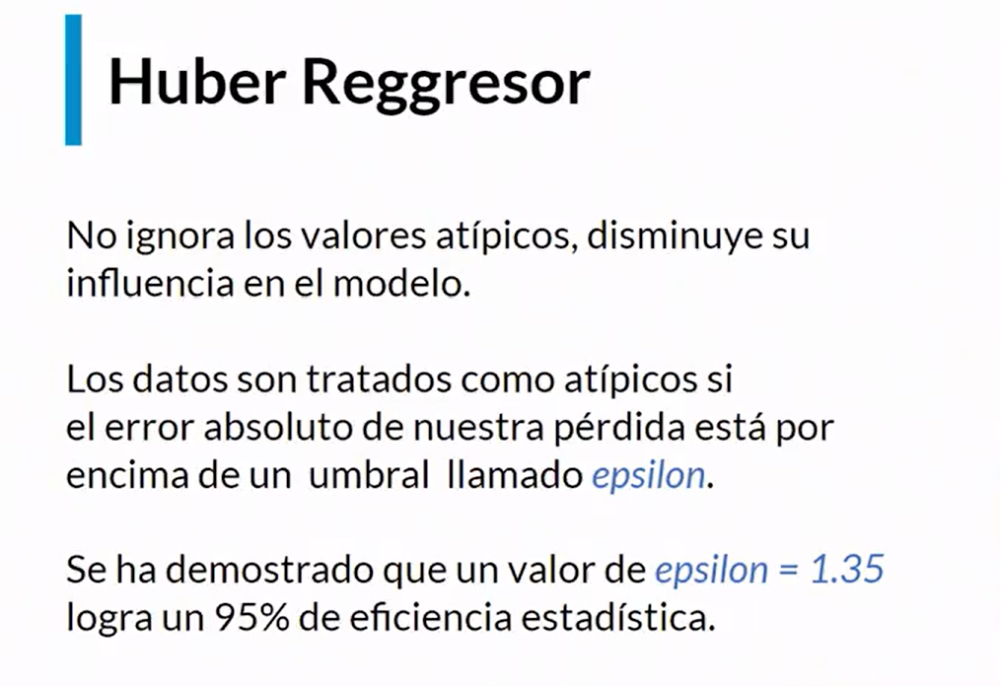

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scipy as sp
import pyspark
import seaborn as sns

import sklearn

from sklearn.linear_model import (
    RANSACRegressor, HuberRegressor
)

from sklearn.svm import SVR

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

## Introducción a los métodos de ensamble:

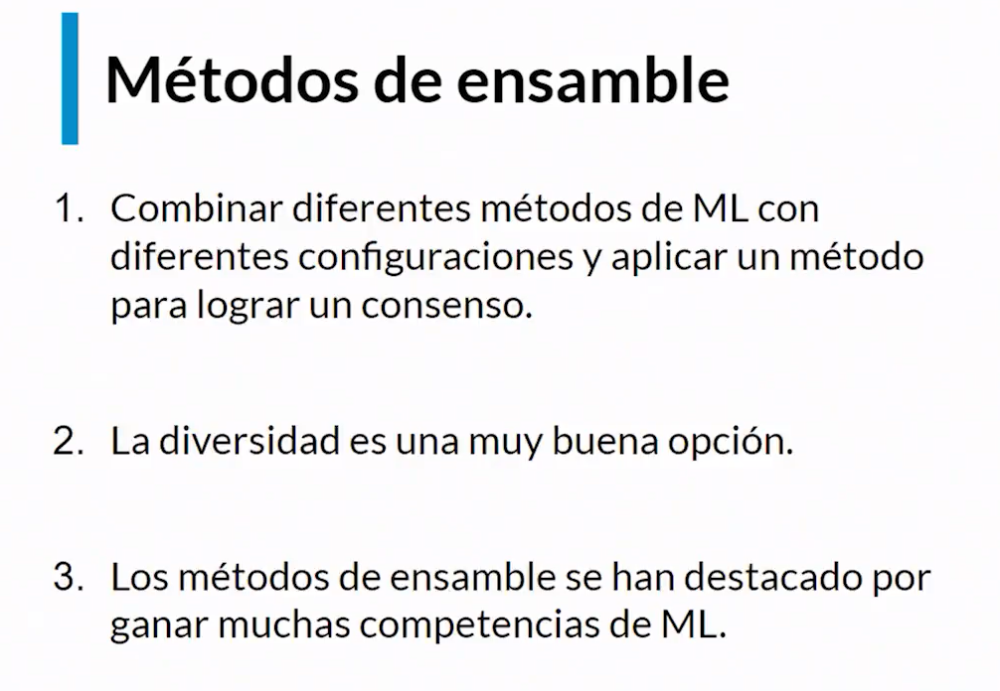

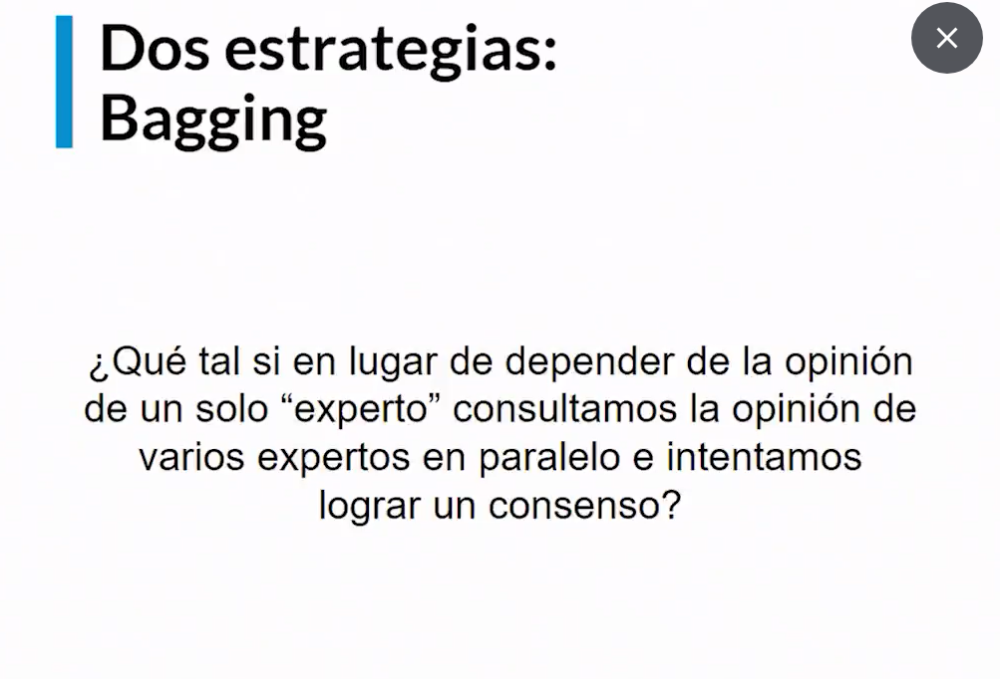

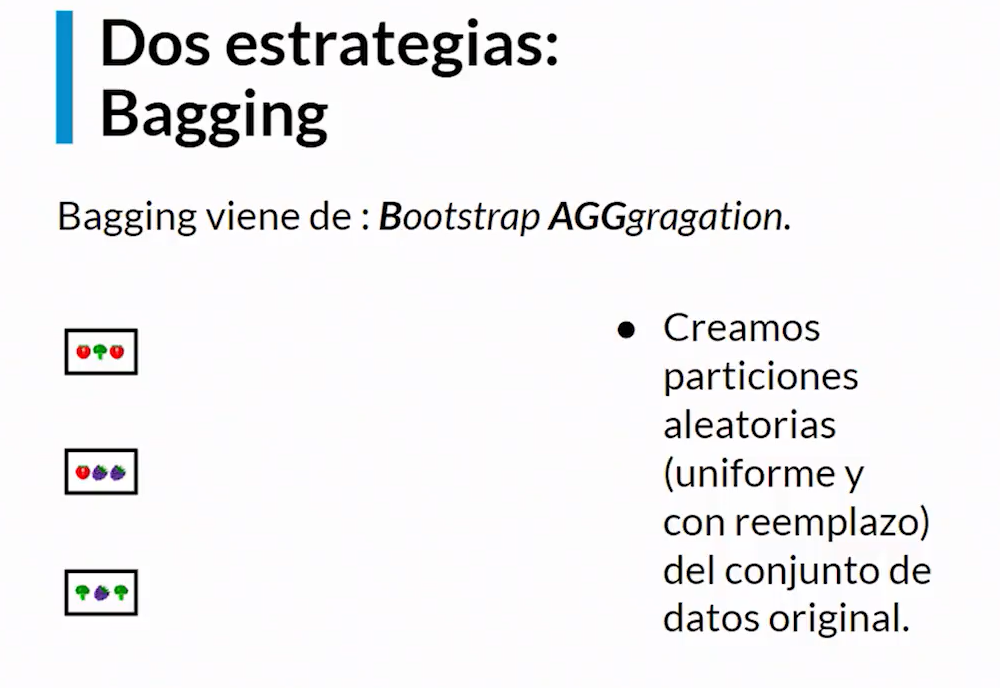

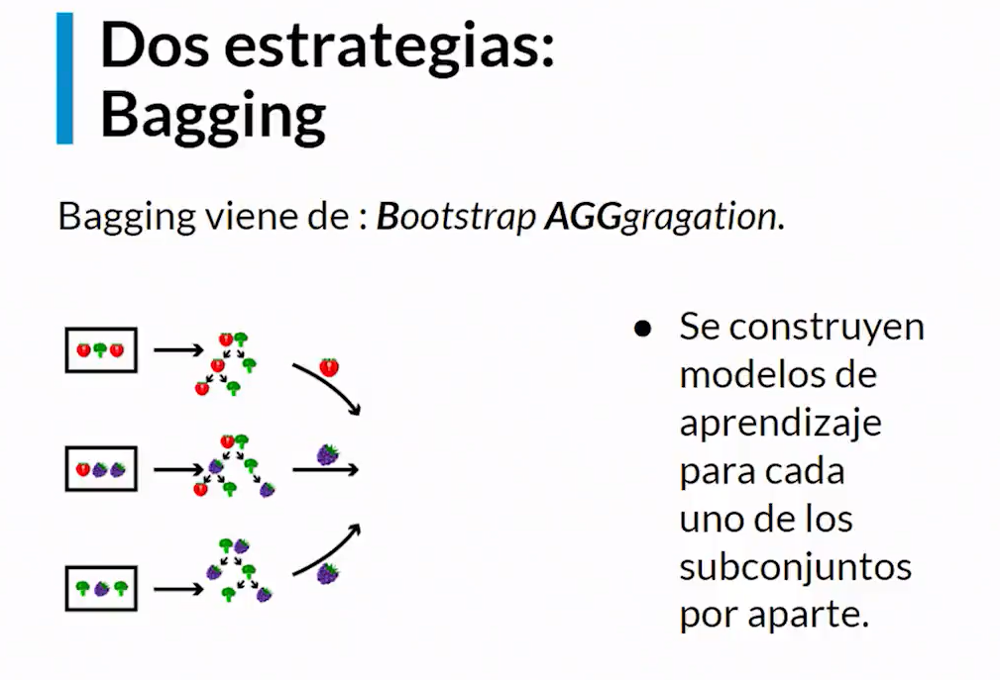

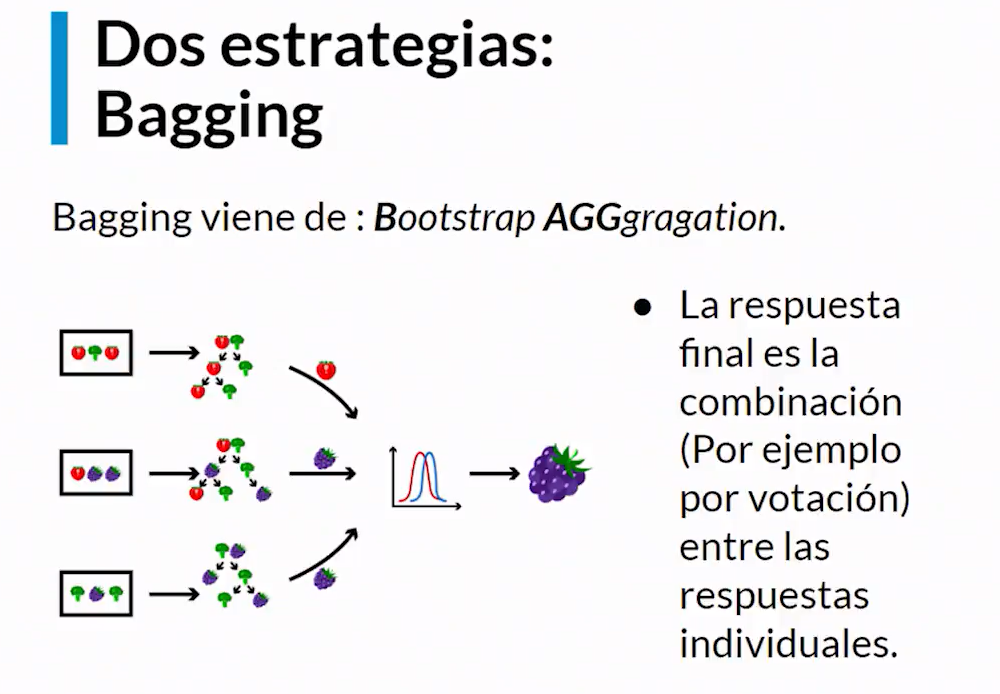

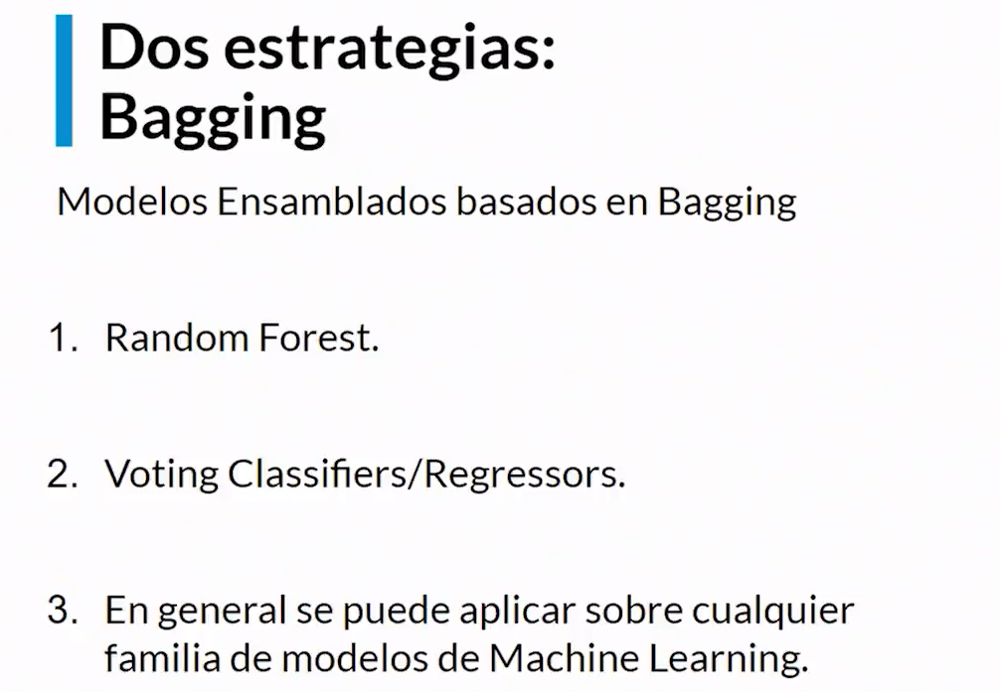

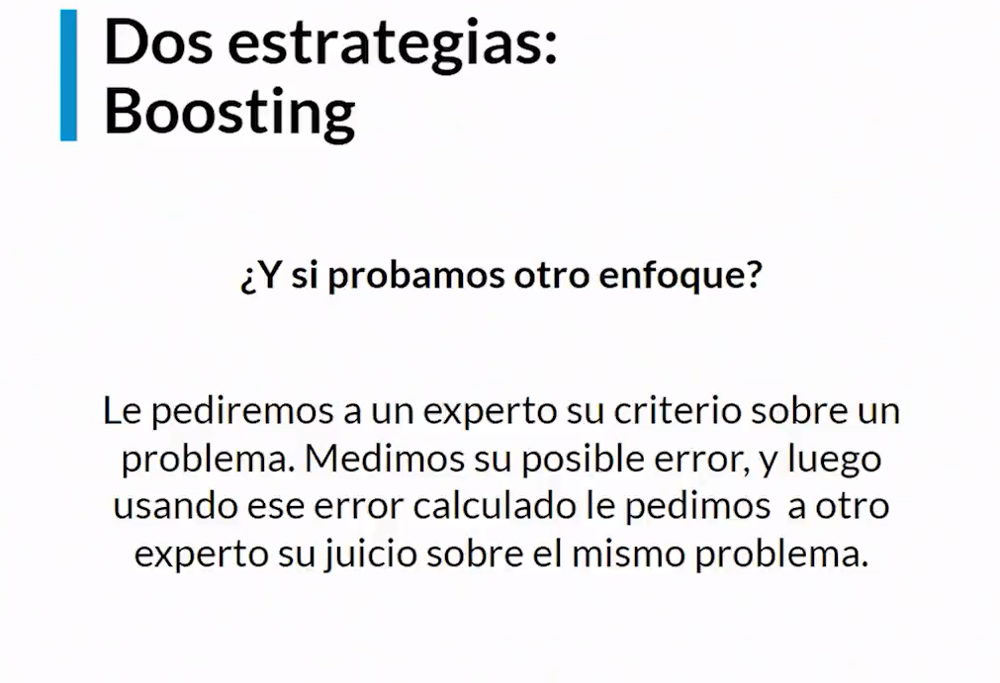

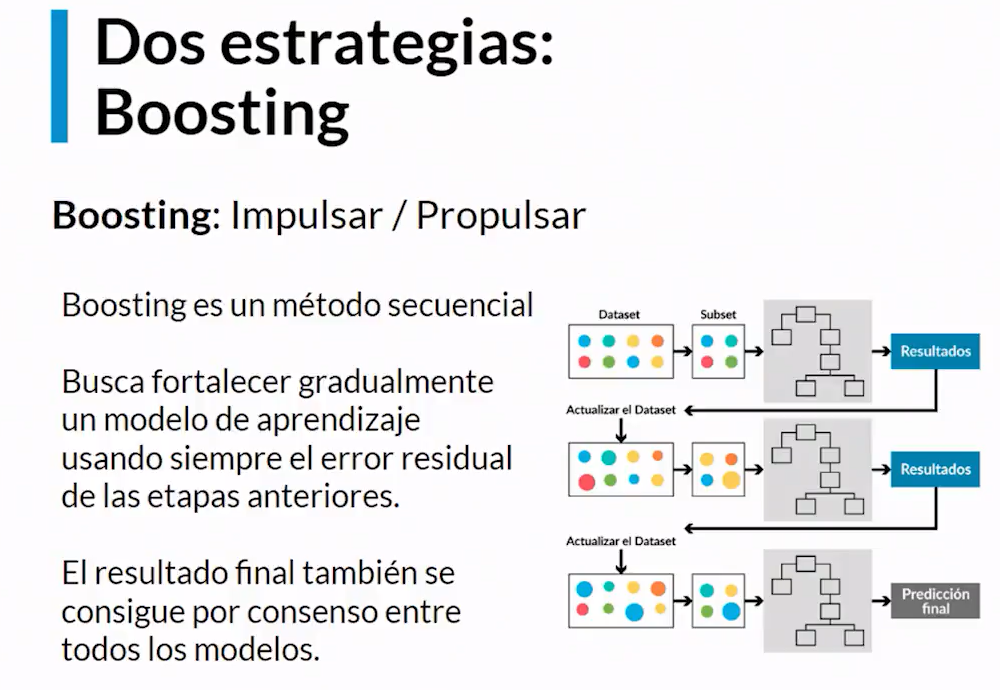

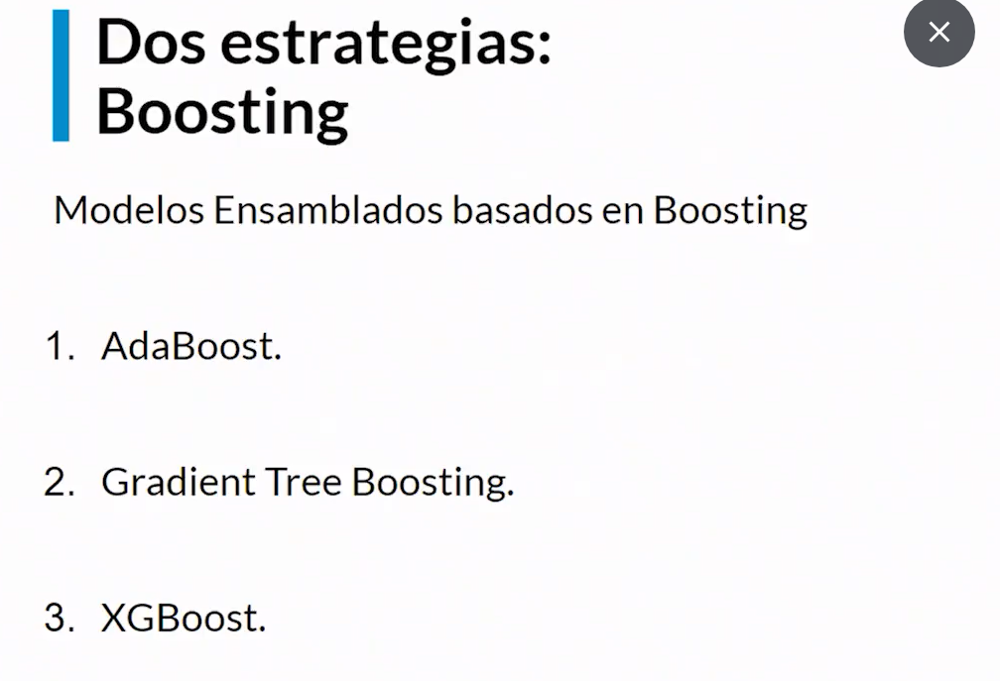

Para este caso, haremos uso del dataset "heart", para clasificar la variable "target".

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scipy as sp
import pyspark
import seaborn as sns

import sklearn

from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import BaggingClassifier

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

#Datos:
heart.head()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,52,1,0,125,212,0,1,168,0,1.0,2,2,3,0
1,53,1,0,140,203,1,0,155,1,3.1,0,0,3,0
2,70,1,0,145,174,0,1,125,1,2.6,0,0,3,0
3,61,1,0,148,203,0,1,161,0,0.0,2,1,3,0
4,62,0,0,138,294,1,1,106,0,1.9,1,3,2,0


In [30]:
# Separamos las variables predictivas de la variable dependiente:
X = heart.drop("target", axis=1)
y = heart["target"]

In [31]:
# Separamos el conjunto de entrenamiento y de prueba:
X_train, X_test, y_train, y_test = train_test_split(X, y ,test_size=0.3, random_state=42)

In [32]:
# Definimos y entrenamos nuestro modelo
knn_class = KNeighborsClassifier().fit(X_train, y_train)

# Y hacemos las predicciones:
knn_predict = knn_class.predict(X_test)

# Ahora, calculamos el accuracy del modelo:

print("="*50)
print("Accuracy del modelo: ", accuracy_score(y_test, knn_predict))


Accuracy del modelo:  0.7142857142857143


In [33]:

# Luego definimos y entrenamos el modelo de Bagging:
bag_class = BaggingClassifier(base_estimator=KNeighborsClassifier(), n_estimators=50).fit(X_train, y_train)

# Realizamos las predicciones:
bag_predict = bag_class.predict(X_test)

# Imprimimos el accuracy del modelo:

print("="*50)
print("Accuracy del modelo: ", accuracy_score(y_test, bag_predict))

Accuracy del modelo:  0.7402597402597403


c:\Program Files\Python311\Lib\site-packages\sklearn\ensemble\_base.py:156: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Implementación del Gradient Boosting Classifier

In [34]:
from sklearn.ensemble import GradientBoostingClassifier

boost = GradientBoostingClassifier(n_estimators=50).fit(X_train, y_train)

boost_predict = boost.predict(X_test)

print("="*50)
print("Accuracy del modelo: ", accuracy_score(y_test, boost_predict))

Accuracy del modelo:  0.9285714285714286


## Clustering

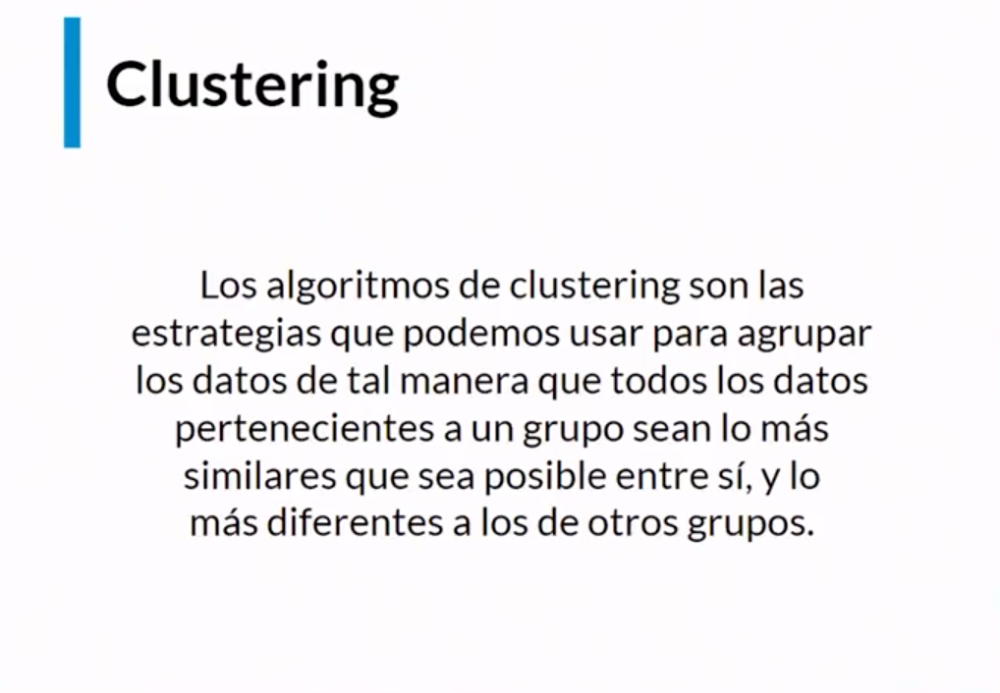

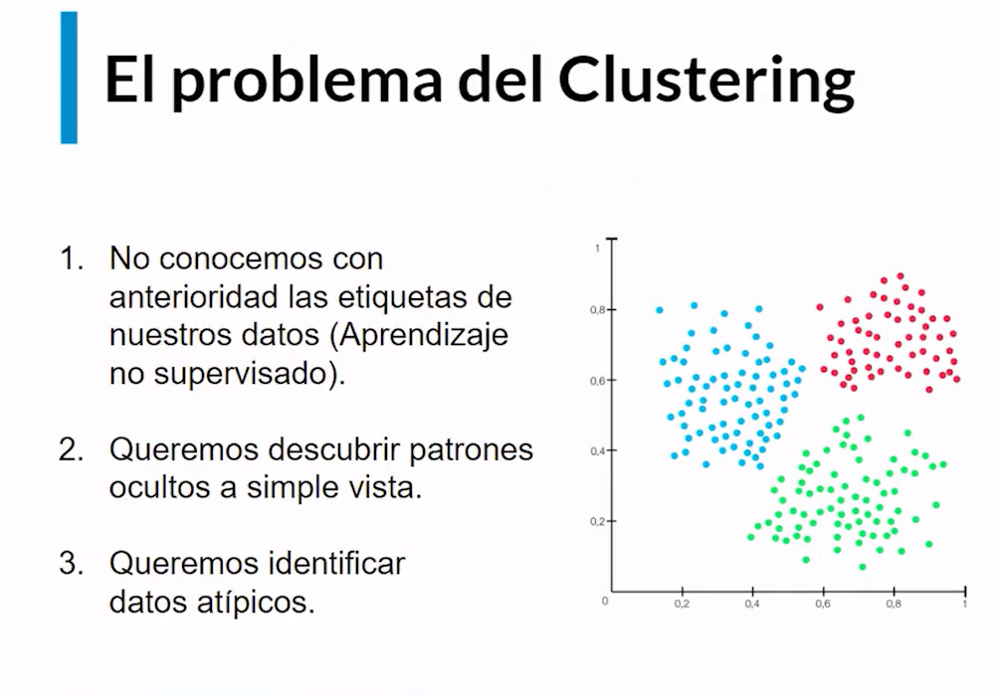

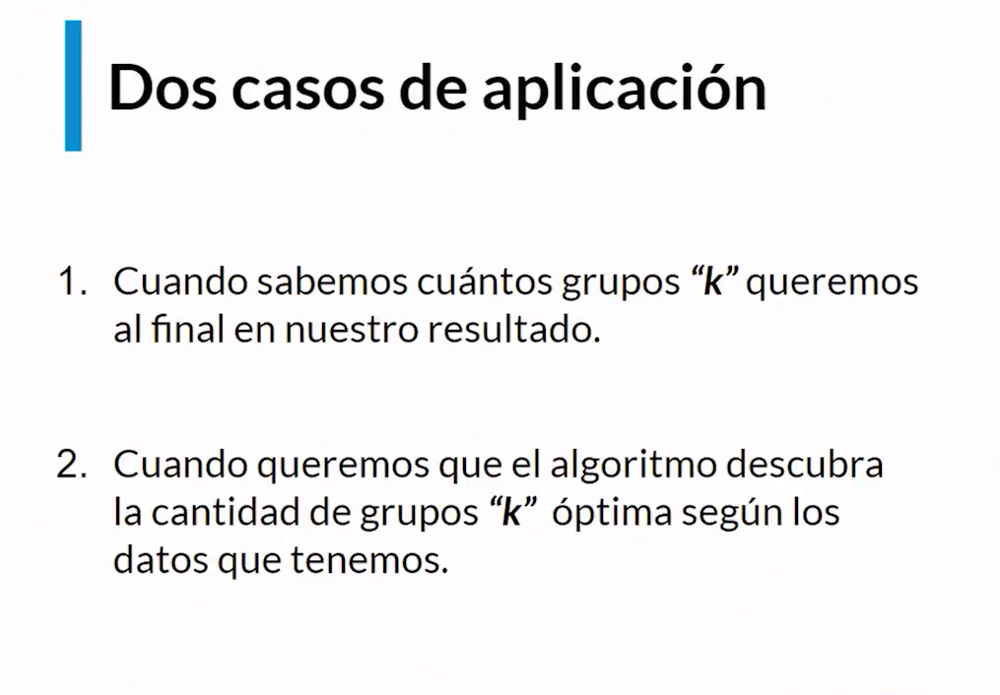

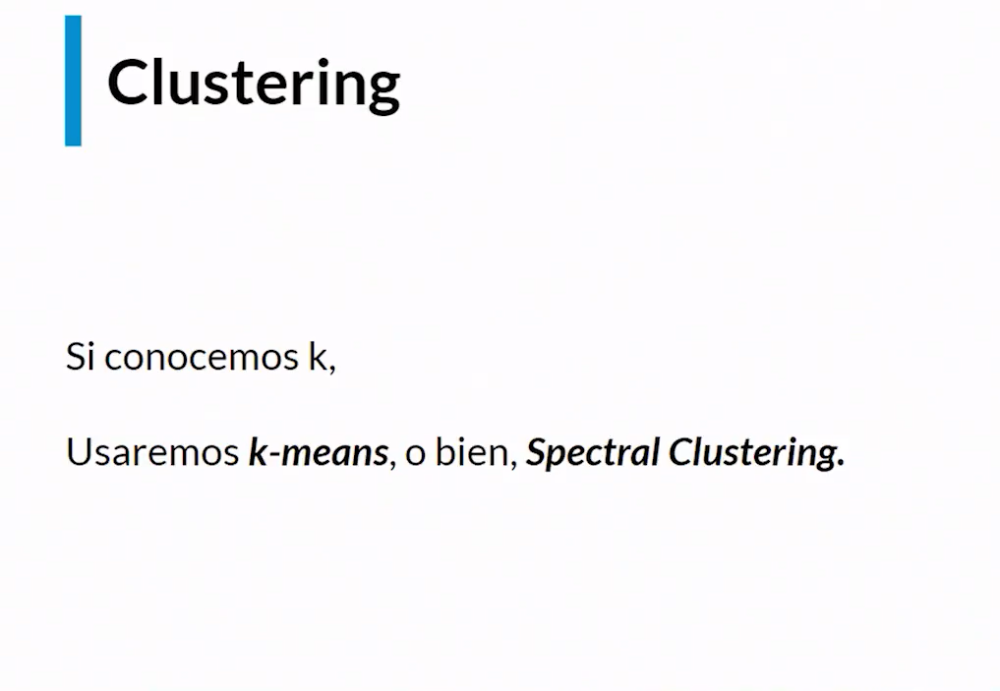

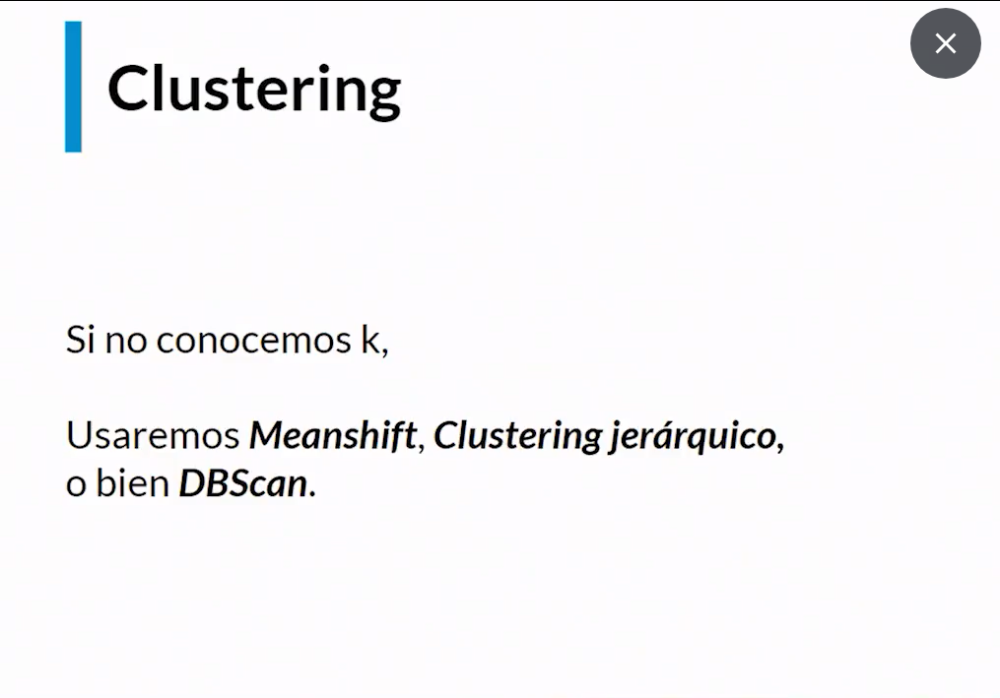

In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import scipy as sp
import pyspark
import seaborn as sns

import sklearn

from sklearn.cluster import MiniBatchKMeans

candy.head()

,competitorname,chocolate,fruity,caramel,peanutyalmondy,nougat,crispedricewafer,hard,bar,pluribus,sugarpercent,pricepercent,winpercent
0,100 Grand,1,0,1,0,0,1,0,1,0,0.732,0.860,66.971725
1,3 Musketeers,1,0,0,0,1,0,0,1,0,0.604,0.511,67.602936
2,One dime,0,0,0,0,0,0,0,0,0,0.011,0.116,32.261086
3,One quarter,0,0,0,0,0,0,0,0,0,0.011,0.511,46.116505
4,Air Heads,0,1,0,0,0,0,0,0,0,0.906,0.511,52.341465


In [36]:
X = candy.drop("competitorname", axis=1)

kmeans = MiniBatchKMeans(n_clusters=4, batch_size=8).fit(X)

print("Total de centros: ", len(kmeans.cluster_centers_))

c:\Program Files\Python311\Lib\site-packages\sklearn\cluster\_kmeans.py:1934: FutureWarning: The default value of `n_init` will change from 3 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=3)


Total de centros:  4


In [37]:
# Ahora, podemos ver las predicciones:

print("="*50)
print("Predicciones: ", kmeans.predict(X))

Predicciones:  [1 1 0 3 3 3 2 0 0 0 0 0 0 3 0 3 0 3 2 0 3 3 2 2 2 2 0 2 1 0 0 3 1 1 3 2 1
 2 2 3 2 2 1 1 0 0 3 1 0 0 0 1 1 1 1 0 1 0 3 0 2 2 0 3 1 2 2 3 1 0 0 0 0 2
 3 3 3 3 3 1 3 0 3 3 3]


In [38]:
candy["group"] = kmeans.predict(X)

candy.head()

,competitorname,chocolate,fruity,caramel,peanutyalmondy,nougat,crispedricewafer,hard,bar,pluribus,sugarpercent,pricepercent,winpercent,group
0,100 Grand,1,0,1,0,0,1,0,1,0,0.732,0.860,66.971725,1
1,3 Musketeers,1,0,0,0,1,0,0,1,0,0.604,0.511,67.602936,1
2,One dime,0,0,0,0,0,0,0,0,0,0.011,0.116,32.261086,0
3,One quarter,0,0,0,0,0,0,0,0,0,0.011,0.511,46.116505,3
4,Air Heads,0,1,0,0,0,0,0,0,0,0.906,0.511,52.341465,3


Implementación de mean shift

In [39]:
from sklearn.cluster import MeanShift

candy.head()

,competitorname,chocolate,fruity,caramel,peanutyalmondy,nougat,crispedricewafer,hard,bar,pluribus,sugarpercent,pricepercent,winpercent,group
0,100 Grand,1,0,1,0,0,1,0,1,0,0.732,0.860,66.971725,1
1,3 Musketeers,1,0,0,0,1,0,0,1,0,0.604,0.511,67.602936,1
2,One dime,0,0,0,0,0,0,0,0,0,0.011,0.116,32.261086,0
3,One quarter,0,0,0,0,0,0,0,0,0,0.011,0.511,46.116505,3
4,Air Heads,0,1,0,0,0,0,0,0,0,0.906,0.511,52.341465,3


In [40]:
# Eliminamos la columna de los nombres de los caramelos:
X = candy.drop("competitorname", axis=1)

In [41]:
mean_shitf = MeanShift().fit(X)
print("Etiquetas \n",mean_shitf.labels_)
print("Número de clusters: ", len(mean_shitf.cluster_centers_))

candy["meanshift_group"] = mean_shitf.labels_

Etiquetas 
 [1 1 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 1 1 1 0 1 1 0 0 1 1 1 0 1 1
 1 1 0 1 1 1 1 0 0 0 1 0 0 0 1 1 1 1 0 1 0 0 0 1 1 0 0 1 1 1 0 1 0 0 0 0 1
 0 0 0 0 0 1 0 0 0 0 0]
Número de clusters:  2


## Cross-Validation

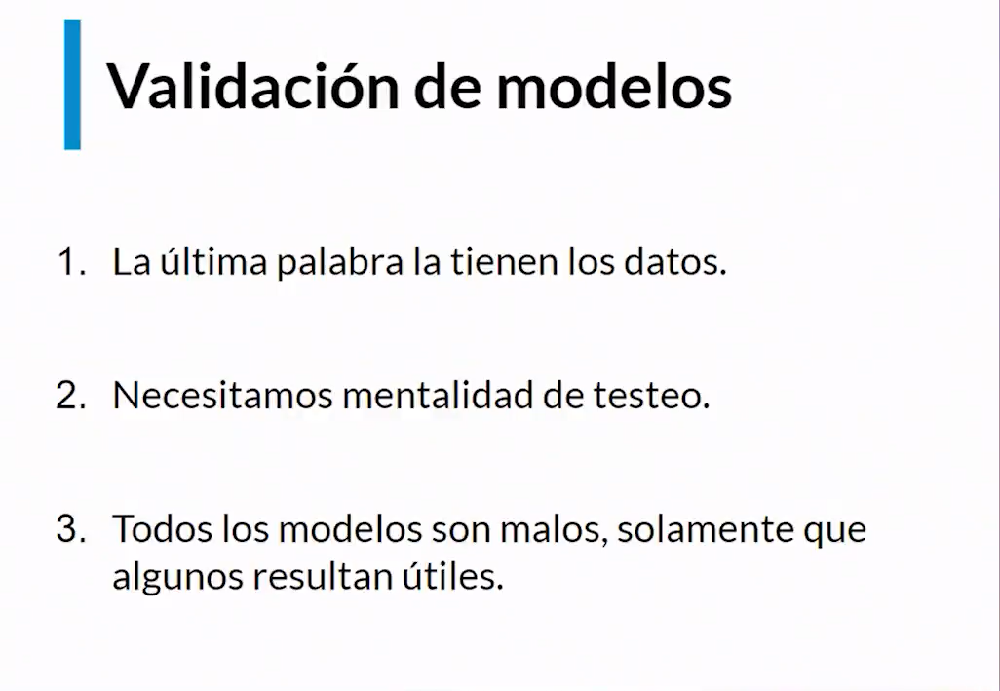

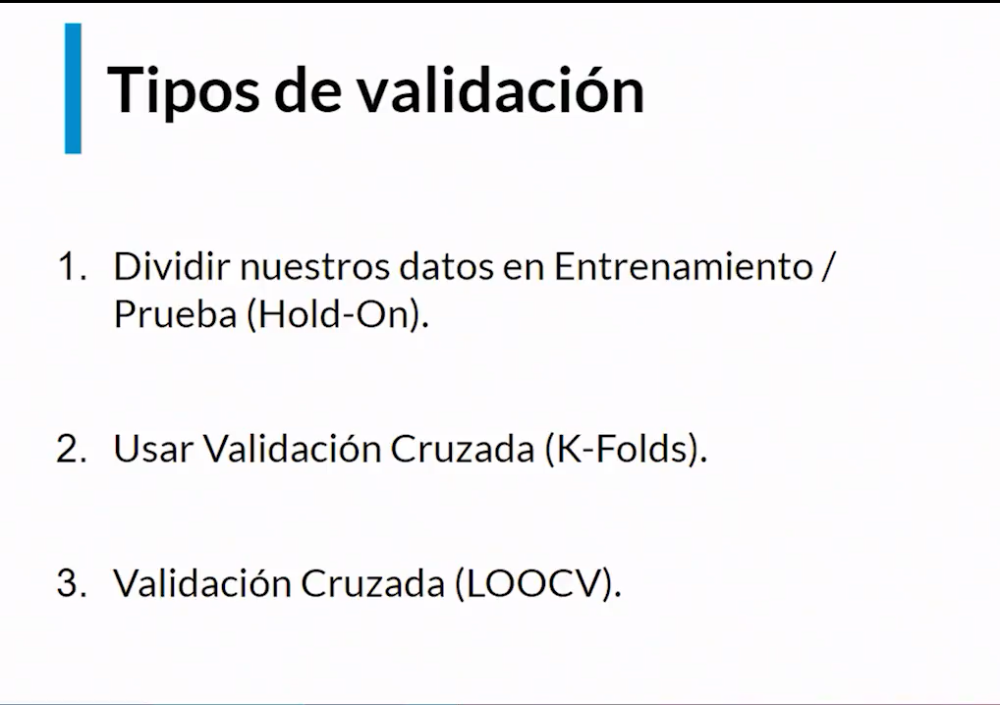

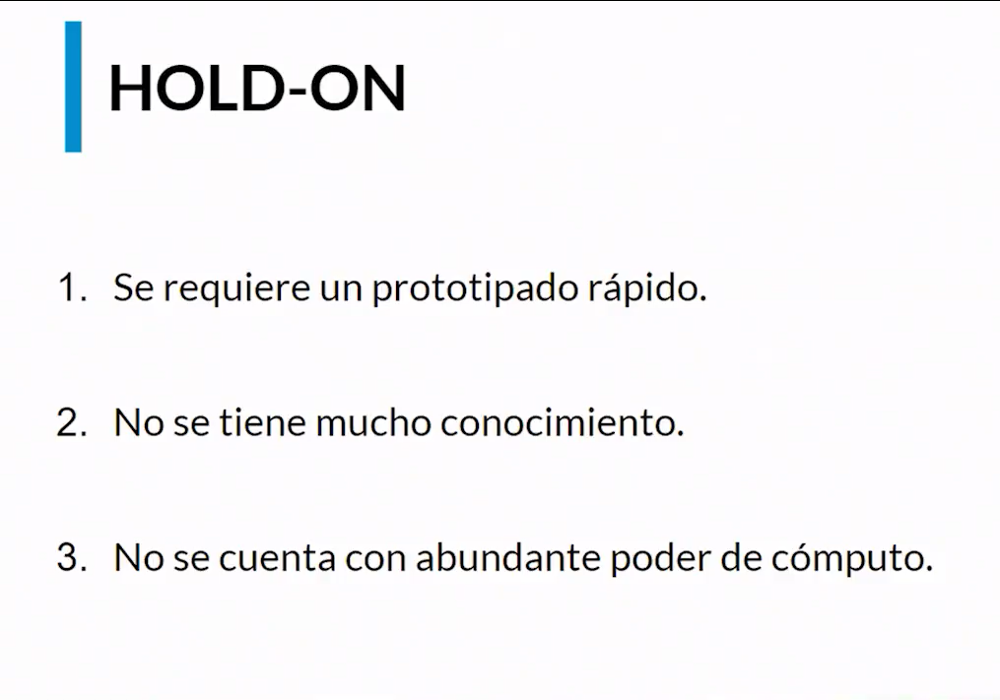

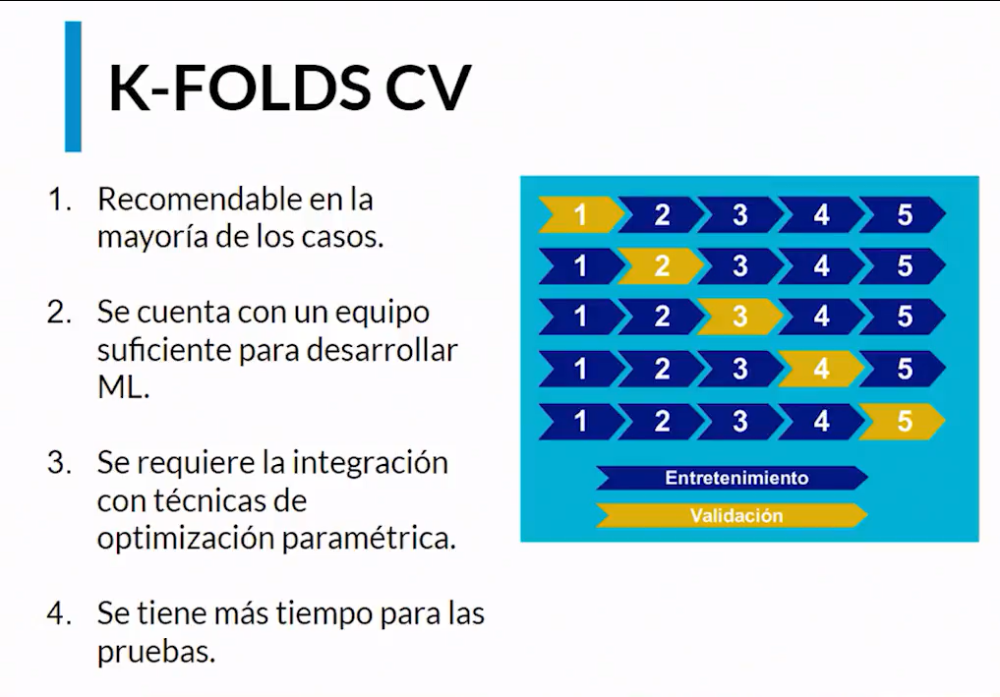

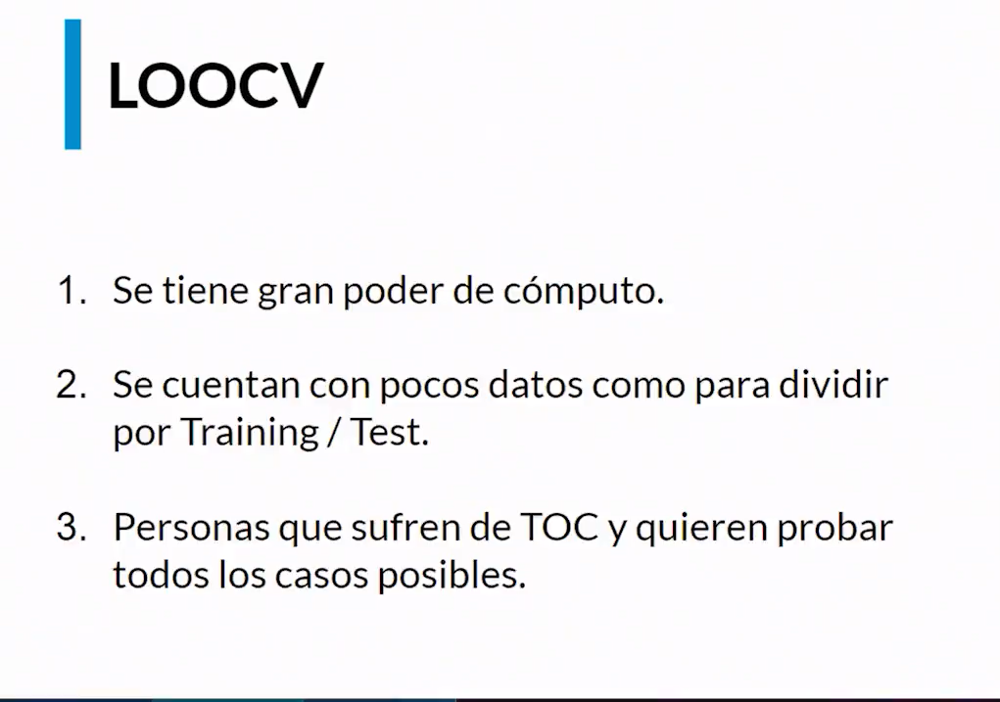

Implementación de Cross-Validation:

In [42]:
from sklearn.tree import DecisionTreeRegressor

from sklearn.model_selection import (
    cross_val_score, KFold
)

happiness.head()

,country,rank,score,high,low,gdp,family,lifexp,freedom,generosity,corruption,dystopia
0,Norway,1,7.537,7.594445,7.479556,1.616463,1.533524,0.796667,0.635423,0.362012,0.315964,2.277027
1,Denmark,2,7.522,7.581728,7.462272,1.482383,1.551122,0.792566,0.626007,0.355280,0.400770,2.313707
2,Iceland,3,7.504,7.622030,7.385970,1.480633,1.610574,0.833552,0.627163,0.475540,0.153527,2.322715
3,Switzerland,4,7.494,7.561772,7.426227,1.564980,1.516912,0.858131,0.620071,0.290549,0.367007,2.276716
4,Finland,5,7.469,7.527542,7.410458,1.443572,1.540247,0.809158,0.617951,0.245483,0.382612,2.430182


In [50]:
X = happiness.drop(["country","score"], axis=1)
y = happiness["score"]

model  = DecisionTreeRegressor()

score = cross_val_score(model, X, y, cv=5, scoring="neg_mean_squared_error")
    # El parámetro "cv" indica el número de folds que se van a hacer

print("="*50)
print("Scores = ", score)
print("="*50)
print("Score medio (En valor absoluto) = ", np.abs(score.mean()))

Scores =  [-0.41705464 -0.07603424 -0.06339346 -0.08356857 -0.40516469]
Score medio (En valor absoluto) =  0.20904311889108734


## Optimización paramétrica con CV (Cross-Validation)

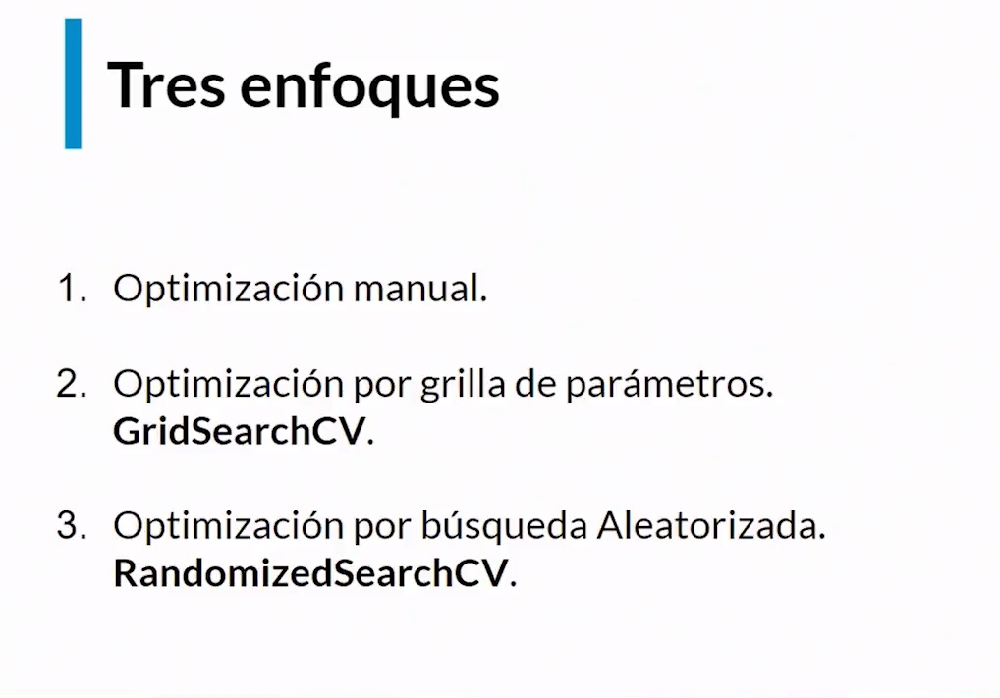

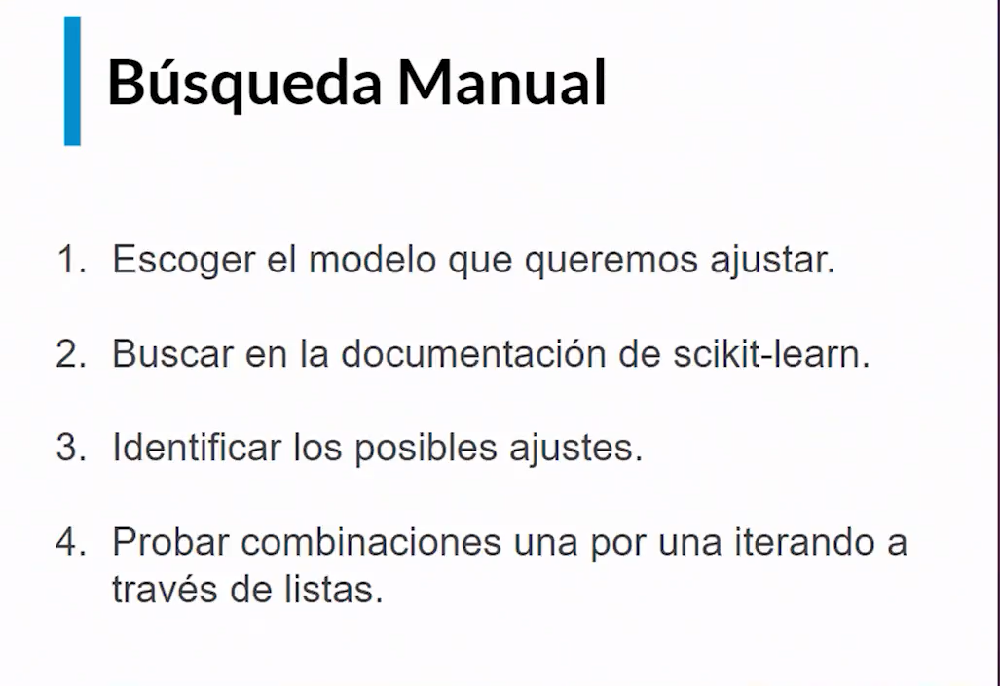

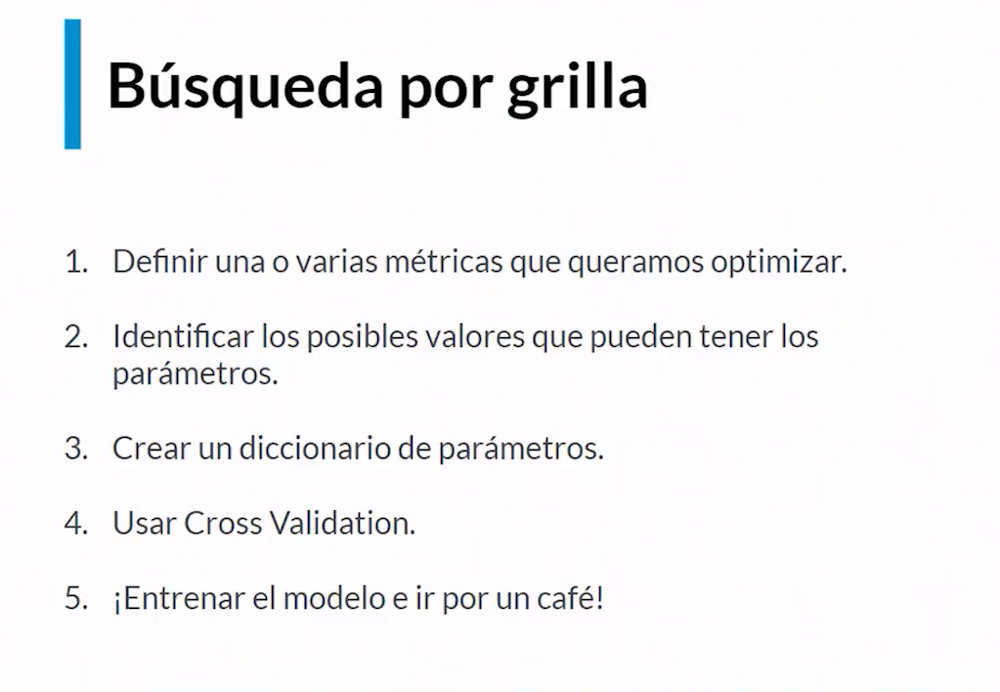

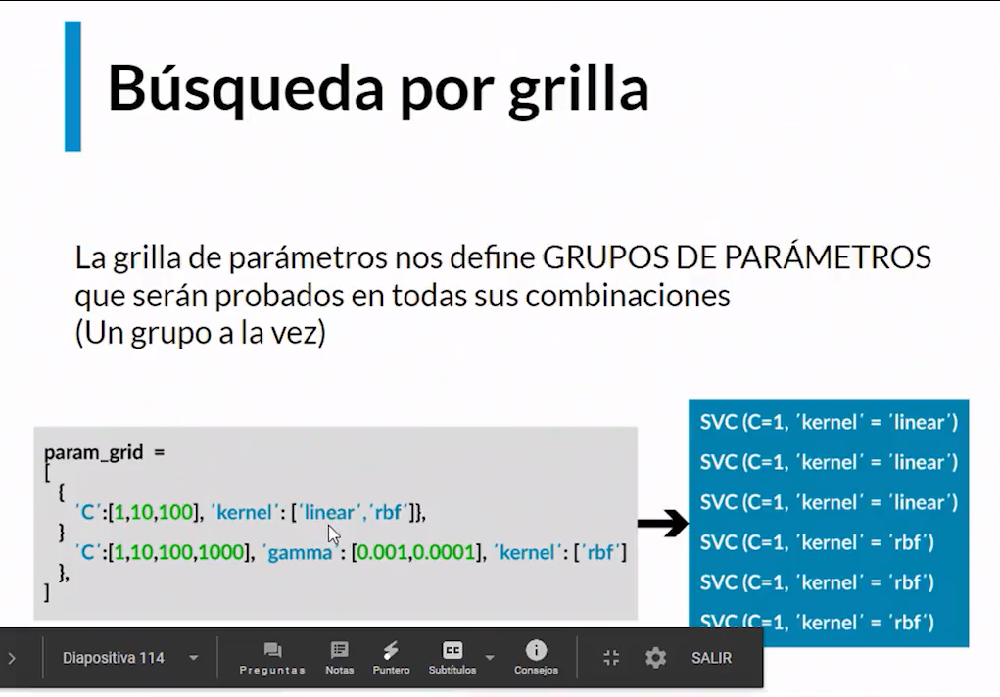

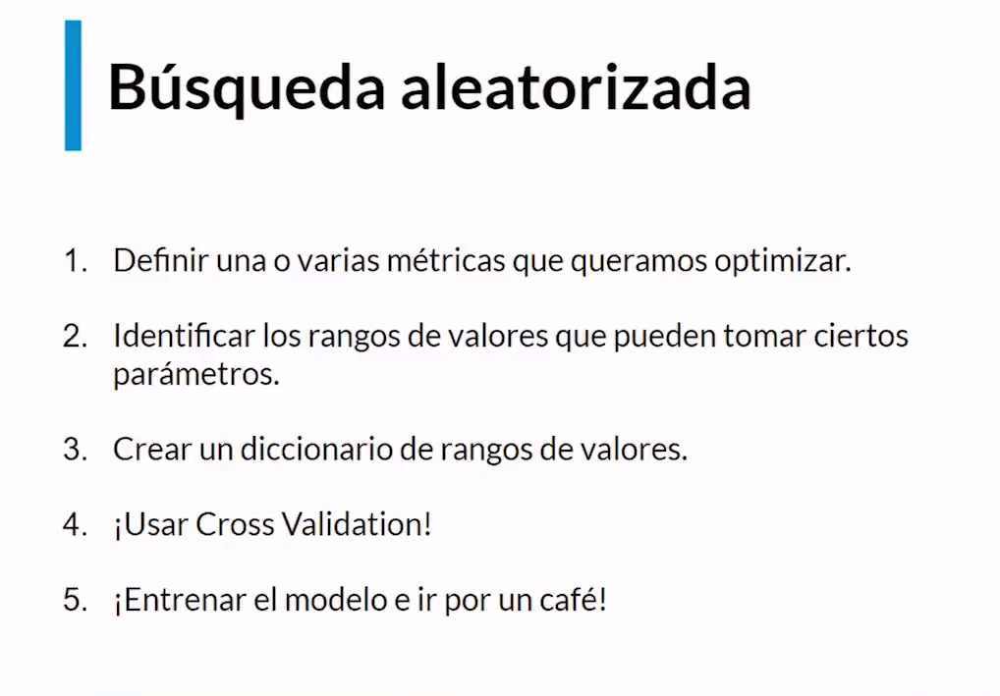

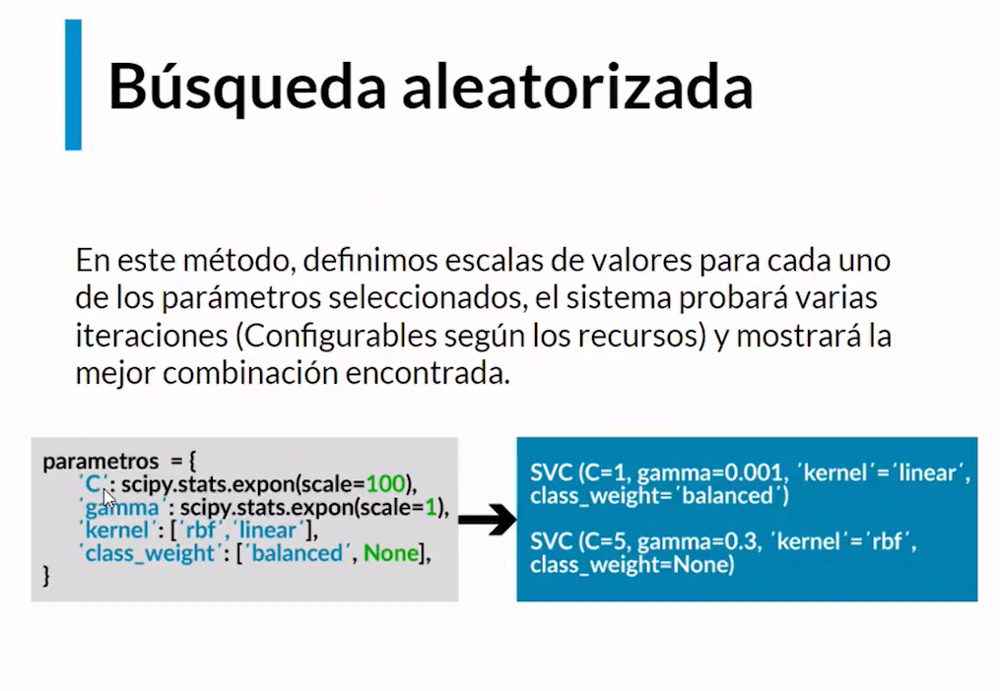

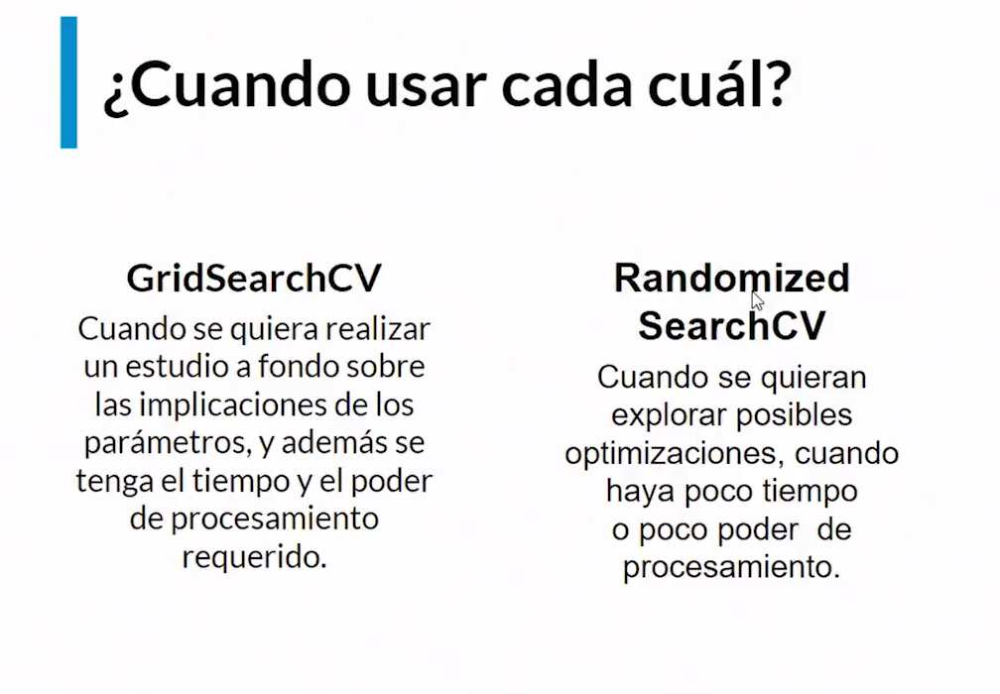

Implementación:

In [51]:
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestRegressor

happiness.head()

,country,rank,score,high,low,gdp,family,lifexp,freedom,generosity,corruption,dystopia
0,Norway,1,7.537,7.594445,7.479556,1.616463,1.533524,0.796667,0.635423,0.362012,0.315964,2.277027
1,Denmark,2,7.522,7.581728,7.462272,1.482383,1.551122,0.792566,0.626007,0.355280,0.400770,2.313707
2,Iceland,3,7.504,7.622030,7.385970,1.480633,1.610574,0.833552,0.627163,0.475540,0.153527,2.322715
3,Switzerland,4,7.494,7.561772,7.426227,1.564980,1.516912,0.858131,0.620071,0.290549,0.367007,2.276716
4,Finland,5,7.469,7.527542,7.410458,1.443572,1.540247,0.809158,0.617951,0.245483,0.382612,2.430182


In [55]:
X = happiness.drop(["country","score", "rank"], axis=1)
y = happiness["score"]

reg = RandomForestRegressor()

parametros = {
    "n_estimators": range(4,16),
    "criterion": ['squared_error', 'friedman_mse', 'poisson', 'absolute_error'],
    "max_depth": range(2,11)
}

rand_est = RandomizedSearchCV(reg, parametros, cv=5, scoring="neg_mean_squared_error", n_iter=10).fit(X,y)

print("="*50)
print(rand_est.best_estimator_)
print(rand_est.best_params_)

RandomForestRegressor(criterion='friedman_mse', max_depth=8, n_estimators=12)
{'n_estimators': 12, 'max_depth': 8, 'criterion': 'friedman_mse'}
